# Oregon ELA

In [30]:
#Oregon ELA

In [1]:
import pandas as pd
import numpy as np
import seaborn
from matplotlib import pyplot as plt

data = pd.read_csv('pagr_schools_ela_tot_raceethnicity_1819 copy.csv', low_memory=False)
oregon_df = pd.DataFrame(data)

In [32]:
oregon_newdf = oregon_df[['District', 'School', 'Subject', 'Student Group', 'Grade Level', 'Number Proficient', 'Percent Proficient (Level 3 or 4)', 'Number Level 4', 'Number Level 3', 'Number Level 2', 'Number Level 1', 'Number of Participants']].copy()
oregon_grade3 = oregon_newdf.loc[(oregon_newdf['Grade Level'] == "Grade 3")]
oregon_grade3 = oregon_grade3.replace('--', np.nan)
oregon_grade3 = oregon_grade3.replace('-', np.nan)
oregon_grade3 = oregon_grade3.replace('*', np.nan)
oregon_grade3 = oregon_grade3[oregon_grade3['Number of Participants'].notna()]
oregon_grade3

,District,School,Subject,Student Group,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants
76,Adrian SD 61,Adrian Elementary School,English Language Arts,Total Population (All Students),Grade 3,10,50.0,2,8,8,2,20
82,Adrian SD 61,Adrian Elementary School,English Language Arts,White,Grade 3,9,50.0,2,7,7,2,18
170,Amity SD 4J,Amity Elementary School,English Language Arts,Total Population (All Students),Grade 3,22,48.9,9,13,12,11,45
173,Amity SD 4J,Amity Elementary School,English Language Arts,White,Grade 3,20,54.1,9,11,11,6,37
300,Annex SD 29,Annex Charter School,English Language Arts,Total Population (All Students),Grade 3,6,46.2,4,2,4,3,13
...,...,...,...,...,...,...,...,...,...,...,...,...
31906,Woodburn SD 103,Woodburn Arthur Academy,English Language Arts,Total Population (All Students),Grade 3,12,48.0,5,7,5,8,26
31956,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,English Language Arts,Total Population (All Students),Grade 3,30,50.0,14,16,19,11,60
31958,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,English Language Arts,White,Grade 3,29,53.7,14,15,16,9,54
32036,Yoncalla SD 32,Yoncalla Elementary School,English Language Arts,Total Population (All Students),Grade 3,4,36.4,1,3,3,4,11


In [33]:
oregon_grade3['Number Proficient'] = pd.to_numeric(oregon_grade3['Number Proficient'])
oregon_grade3['Percent Proficient (Level 3 or 4)'] = pd.to_numeric(oregon_grade3['Percent Proficient (Level 3 or 4)'])
oregon_grade3['Number Level 4'] = pd.to_numeric(oregon_grade3['Number Level 4'])
oregon_grade3['Number Level 3'] = pd.to_numeric(oregon_grade3['Number Level 3'])
oregon_grade3['Number Level 2'] = pd.to_numeric(oregon_grade3['Number Level 2'])
oregon_grade3['Number Level 1'] = pd.to_numeric(oregon_grade3['Number Level 1'])
oregon_grade3['Number of Participants'] = pd.to_numeric(oregon_grade3['Number of Participants'])

## Oregon ELA Population Distribution

Chart that shows the whole population's distribution: 


<ipython-input-34-4e4e92d2d2ac>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  sum_level1 = total.groupby('Student Group')['Number Level 1', 'Number Level 2', 'Number Level 3', 'Number Level 4'].sum()


Text(0, 0.5, 'Number of Students')

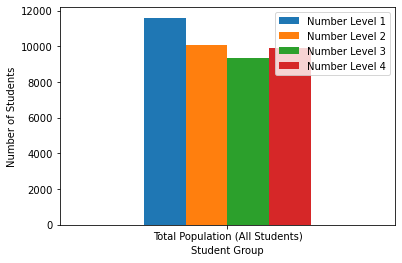

In [34]:
total = oregon_grade3.loc[oregon_grade3['Student Group'] == 'Total Population (All Students)']
sum_level1 = total.groupby('Student Group')['Number Level 1', 'Number Level 2', 'Number Level 3', 'Number Level 4'].sum()
print("Chart that shows the whole population's distribution: ")
ax = sum_level1.plot(kind = 'bar')
plt.xticks(rotation=0)
plt.ylabel("Number of Students")

In [35]:
# Number of times each value is present (not number of students within the student group)
print(oregon_grade3['Student Group'].value_counts())

Total Population (All Students)    691
White                              662
Hispanic/Latino                    317
Asian                               39
Multi-Racial                        36
Black/African American              19
American Indian/Alaskan Native       4
Name: Student Group, dtype: int64


In [ ]:
print(oregon_grade3['School'].value_counts())

### Level 4 Student Group Data

In [ ]:
# Distribution over Student Groups for Level 4 Per School
grade3_level4 = oregon_grade3.groupby(['Number Level 4', 'Student Group']).size()
grade3_level4 = pd.DataFrame(grade3_level4.reset_index(name = "Group_Count"))
grade3_level4

In [ ]:
# Distribution per school 
res = seaborn.catplot(x="Number Level 4", y="Student Group", data=grade3_level4) 
plt.show()

### Level 3 Student Group Data

In [ ]:
# Distribution over Student Groups for Level 3 Per School
grade3_level3 = oregon_grade3.groupby(['Number Level 3', 'Student Group']).size()
grade3_level3 = pd.DataFrame(grade3_level3.reset_index(name = "Group_Count"))
grade3_level3

In [ ]:
res = seaborn.catplot(x="Number Level 3", y="Student Group", data=grade3_level3)
plt.show()

### Level 2 Student Group Data

In [ ]:
# Distribution over Student Groups for Level 2 Per School
grade3_level2 = oregon_grade3.groupby(['Number Level 2', 'Student Group']).size()
grade3_level2 = pd.DataFrame(grade3_level2.reset_index(name = "Group_Count"))
grade3_level2

In [ ]:
res = seaborn.catplot(x="Number Level 2", y="Student Group", data=grade3_level2)
plt.show()

### Level 1 Student Group Data

In [ ]:
# Distribution over Student Groups for Level 1 Per School
grade3_level1 = oregon_grade3.groupby(['Number Level 1', 'Student Group']).size()
grade3_level1 = pd.DataFrame(grade3_level1.reset_index(name = "Group_Count"))
grade3_level1

In [ ]:
res = seaborn.catplot(x="Number Level 1", y="Student Group", data=grade3_level1)
plt.show()

### Sum of Students per Group in Level 1

In [ ]:
# Finding sum of each Student Group Per Level

In [ ]:
# Difference in total and sum of groups is due to NaN
sum_level1 = oregon_grade3
sum_level1['Number Level 1'] = pd.to_numeric(sum_level1['Number Level 1'])
sum_level1= sum_level1.groupby('Student Group') [ "Number Level 1"].sum().to_frame(name = 'Level 1 Per Group').reset_index()
sum_level1

In [ ]:
print("Each Student Group in ELA Level 1 has a count of: ")
ax = sum_level1.plot(kind = 'bar')

### Sum of Students Per Group in Level 2

In [ ]:
# Finding sum of each Student Group Per Level

In [ ]:
# Difference and total and sum of groups is due to NaN
sum_level2 = oregon_grade3
sum_level2['Number Level 2'] = pd.to_numeric(sum_level2['Number Level 2'])
sum_level2 = sum_level2.groupby('Student Group')['Number Level 2'].sum()
sum_level2

In [ ]:
print("Each Student Group in ELA Level 2 has a count of: ")
ax = sum_level2.plot(kind = 'bar')

### Sum of Students Per Group in Level 3

In [ ]:
# Finding sum of each Student Group Per Level

In [ ]:
# Difference and total and sum of groups is due to NaN
sum_level3 = oregon_grade3
sum_level3['Number Level 3'] = pd.to_numeric(sum_level3['Number Level 3'])
sum_level3 = sum_level3.groupby('Student Group')['Number Level 3'].sum()
sum_level3

In [ ]:
print("Each Student Group in ELA Level 3 has a count of: ")
ax = sum_level3.plot(kind = 'bar')

### Sum of Students Per Group in Level 4

In [ ]:
# Difference and total and sum of groups is due to NaN
sum_level4 = oregon_grade3
sum_level4['Number Level 4'] = pd.to_numeric(sum_level4['Number Level 4'])
sum_level4 = sum_level4.groupby('Student Group')['Number Level 4'].sum()
sum_level4

In [ ]:
print("Each Student Group in ELA Level 4 has a count of: ")
ax = sum_level4.plot(kind = 'bar')

### Add Proficiency Column
Determines whether student group scores proficiently

In [36]:
#Adding column to declare proficiency 

In [37]:
oregon_grade3['Percent Proficient (Level 3 or 4)'] = pd.to_numeric(oregon_grade3['Percent Proficient (Level 3 or 4)'])
oregon_grade3['Overall Proficient?'] = oregon_grade3.apply(lambda x: (1 if (x['Percent Proficient (Level 3 or 4)'] >= 50.0) else 0), axis = 1) 
oregon_grade3.head()

,District,School,Subject,Student Group,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?
76,Adrian SD 61,Adrian Elementary School,English Language Arts,Total Population (All Students),Grade 3,10,50.0,2,8,8,2,20,1
82,Adrian SD 61,Adrian Elementary School,English Language Arts,White,Grade 3,9,50.0,2,7,7,2,18,1
170,Amity SD 4J,Amity Elementary School,English Language Arts,Total Population (All Students),Grade 3,22,48.9,9,13,12,11,45,0
173,Amity SD 4J,Amity Elementary School,English Language Arts,White,Grade 3,20,54.1,9,11,11,6,37,1
300,Annex SD 29,Annex Charter School,English Language Arts,Total Population (All Students),Grade 3,6,46.2,4,2,4,3,13,0


### Categorize Student Groups
0: 'American Indian/Alaskan Native'

1: 'Asian'

2: 'Black/African American'

3: 'Hispanic/Latino'

4: 'Multi-Racial'

5: 'Total Population (All Students)'

6: 'White'

In [38]:
sg = np.unique(oregon_grade3['Student Group'])
sg

array(['American Indian/Alaskan Native', 'Asian',
       'Black/African American', 'Hispanic/Latino', 'Multi-Racial',
       'Total Population (All Students)', 'White'], dtype=object)

In [39]:
from sklearn.preprocessing import LabelEncoder
sgle = LabelEncoder()
sg_labels = sgle.fit_transform(oregon_grade3['Student Group'])
sg_mappings = {index: label for index, label in 
                  enumerate(sgle.classes_)}
sg_mappings

{0: 'American Indian/Alaskan Native',
 1: 'Asian',
 2: 'Black/African American',
 3: 'Hispanic/Latino',
 4: 'Multi-Racial',
 5: 'Total Population (All Students)',
 6: 'White'}

In [40]:
#{0: 'American Indian/Alaskan Native',
# 1: 'Asian',
# 2: 'Black/African American',
# 3: 'Hispanic/Latino',
# 4: 'Multi-Racial',
# 5: 'Total Population (All Students)',
# 6: 'White'}
oregon_grade3['Student Group'] = sg_labels

## Begin Classification

In [2]:
# Imports for classification
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix

In [42]:
df = pd.get_dummies(oregon_grade3, columns=['Student Group'], drop_first=True)
df

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
76,Adrian SD 61,Adrian Elementary School,English Language Arts,Grade 3,10,50.0,2,8,8,2,20,1,0,0,0,0,1,0
82,Adrian SD 61,Adrian Elementary School,English Language Arts,Grade 3,9,50.0,2,7,7,2,18,1,0,0,0,0,0,1
170,Amity SD 4J,Amity Elementary School,English Language Arts,Grade 3,22,48.9,9,13,12,11,45,0,0,0,0,0,1,0
173,Amity SD 4J,Amity Elementary School,English Language Arts,Grade 3,20,54.1,9,11,11,6,37,1,0,0,0,0,0,1
300,Annex SD 29,Annex Charter School,English Language Arts,Grade 3,6,46.2,4,2,4,3,13,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31906,Woodburn SD 103,Woodburn Arthur Academy,English Language Arts,Grade 3,12,48.0,5,7,5,8,26,0,0,0,0,0,1,0
31956,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,English Language Arts,Grade 3,30,50.0,14,16,19,11,60,1,0,0,0,0,1,0
31958,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,English Language Arts,Grade 3,29,53.7,14,15,16,9,54,1,0,0,0,0,0,1
32036,Yoncalla SD 32,Yoncalla Elementary School,English Language Arts,Grade 3,4,36.4,1,3,3,4,11,0,0,0,0,0,1,0


In [43]:
numeric_cols = ['Overall Proficient?', 'Percent Proficient (Level 3 or 4)']
other_cols = ['District', 'School', 'Subject', 'Grade Level', 'Number Proficient', 'Number Level 4', 'Number Level 3', 'Number Level 2', 'Number Level 1', 'Number of Participants']
cat_cols = list(set(df.columns) - set(numeric_cols) - set(other_cols))
cat_cols.sort()
cat_cols

['Student Group_1',
 'Student Group_2',
 'Student Group_3',
 'Student Group_4',
 'Student Group_5',
 'Student Group_6']

### Correlation Betweeen Each Student Group and their ranking

<AxesSubplot:>

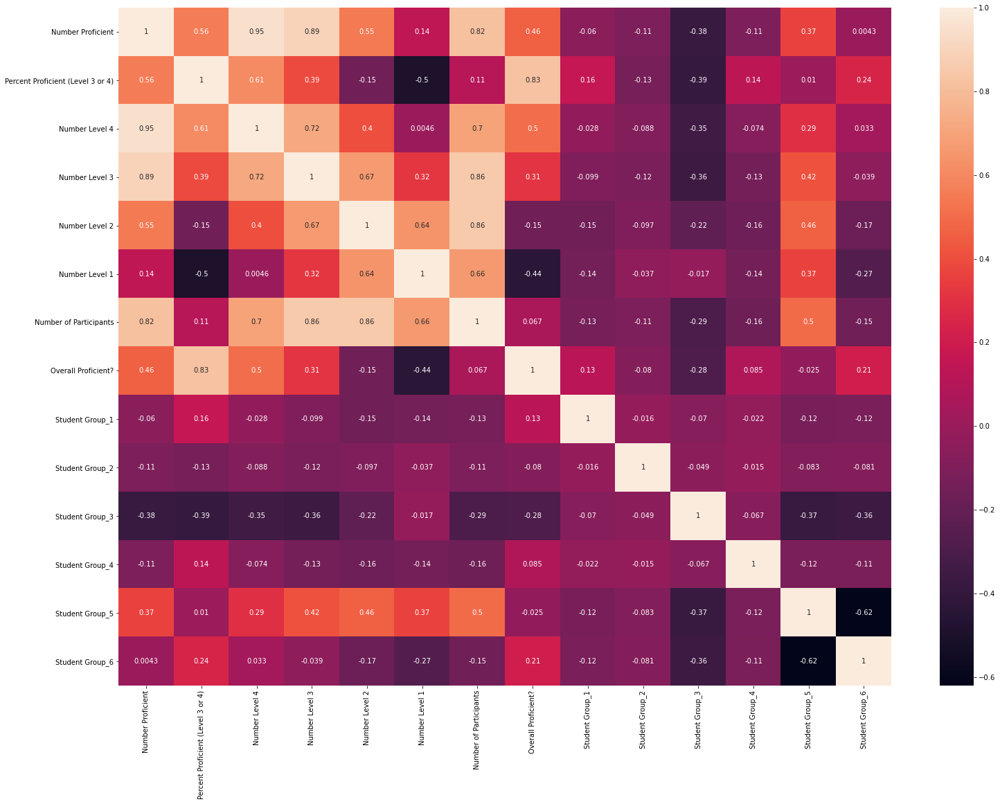

In [44]:
data_corr = df.corr()
plt.figure(figsize=(25,18))
seaborn.heatmap(data_corr, annot=True)

In [45]:
x = df[['Student Group_1', 'Student Group_2', 'Student Group_3', 'Student Group_4', 'Student Group_5', 'Student Group_6']]
y = df['Overall Proficient?']

In [46]:
x, y = np.array(x), np.array(y)

In [47]:
oregon_grade3['Overall Proficient?'].value_counts()

0    1006
1     762
Name: Overall Proficient?, dtype: int64

In [48]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.70)

In [3]:
import lime 
from lime import lime_tabular

In [4]:
# Supporting libraries
import sklearn

import sklearn.datasets
import sklearn.ensemble
import sklearn.model_selection

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

### Logistic Regression

In [51]:
# Train a logistic regression mode
logreg = LogisticRegression(C=1e5)
lrmodel = logreg.fit(train, labels_train)

In [52]:
# Print accuracy
print('Accuracy of Logreg classifier on training set: {:.2f}'.format(logreg.score(train, labels_train)))
print('Accuracy of Logreg classifier on test set: {:.2f}'.format(logreg.score(test, labels_test)))

Accuracy of Logreg classifier on training set: 0.65
Accuracy of Logreg classifier on test set: 0.63


In [53]:
# Predicted values for train and test for RF
pred_train = lrmodel.predict(train)
pred_test = lrmodel.predict(test)

In [54]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[495 217]
 [222 303]]


In [55]:
# Predictive accuracy on training data
#accuracy_score(labels_train, pred_train)

In [56]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[207  87]
 [107 130]]


In [57]:
# Predictive accuracy
#accuracy_score(labels_test, pred_test)

### Lime Explanation for Logistic Regression

In [58]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Student Group_1', 'Student Group_2', 
                                                                          'Student Group_3', 'Student Group_4',
                                                                          'Student Group_5', 'Student Group_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [59]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[28], logreg.predict_proba, top_labels=1)

386


In [60]:
df.iloc[[i]]

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
6450,David Douglas SD 40,Mill Park Elementary School,English Language Arts,Grade 3,13,17.6,6,7,20,41,74,0,0,0,0,0,1,0


In [61]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

### Random Forest 

In [62]:
# Found in his notebooks

In [63]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.80)

In [64]:
rf = RandomForestClassifier(n_estimators=500)
rfmodel = rf.fit(train, labels_train)

In [65]:
# Predicted values for train and test for RF
pred_train = rfmodel.predict(train)
pred_test = rfmodel.predict(test)

In [66]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[570 242]
 [266 336]]


In [67]:
# Predictive accuracy on training data
accuracy_score(labels_train, pred_train)

0.6407355021216408

In [68]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[132  62]
 [ 63  97]]


In [69]:
# Predictive accuracy
accuracy_score(labels_test, pred_test)

0.6468926553672316

In [70]:
#{0: 'American Indian/Alaskan Native',
# 1: 'Asian',
# 2: 'Black/African American',
# 3: 'Hispanic/Latino',
# 4: 'Multi-Racial',
# 5: 'Total Population (All Students)',
# 6: 'White'}

In [71]:
#'0', '1', '2', '3', '4', '5', '6'

## Lime Explanation for Random Forest

In [72]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Student Group_1', 'Student Group_2', 
                                                                          'Student Group_3', 'Student Group_4',
                                                                          'Student Group_5', 'Student Group_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [73]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[i], rf.predict_proba, top_labels=1)

319


In [74]:
df.iloc[[i]]

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
5445,Corvallis SD 509J,Hoover Elementary School,English Language Arts,Grade 3,27,60.0,17,10,9,9,45,1,0,0,0,0,0,1


In [75]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
# CrosstabResults = pd.crosstab(index=oregon_grade3['Student Group'], columns=oregon_grade3['Overall Proficient?'])
# CrosstabResults

# Oregon Math 

In [76]:
#Oregon Math

In [77]:
data = pd.read_csv('pagr_schools_math_tot_raceethnicity_1819.csv', low_memory=False)
oregon_math_df = pd.DataFrame(data)

In [78]:
oregon_math_newdf = oregon_math_df[['District', 'School', 'Subject', 'Student Group', 'Grade Level', 'Number Proficient', 'Percent Proficient (Level 3 or 4)', 'Number Level 4', 'Number Level 3', 'Number Level 2', 'Number Level 1', 'Number of Participants']].copy()
oregon_math_grade3 = oregon_math_newdf.loc[(oregon_math_newdf['Grade Level'] == "Grade 3")]
oregon_math_grade3 = oregon_math_grade3.replace('--', np.nan)
oregon_math_grade3 = oregon_math_grade3.replace('-', np.nan)
oregon_math_grade3 = oregon_math_grade3.replace('*', np.nan)
oregon_math_grade3 = oregon_math_grade3[oregon_math_grade3['Number of Participants'].notna()]
oregon_math_grade3

,District,School,Subject,Student Group,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants
76,Adrian SD 61,Adrian Elementary School,Mathematics,Total Population (All Students),Grade 3,9,45.0,2,7,6,5,20
82,Adrian SD 61,Adrian Elementary School,Mathematics,White,Grade 3,8,44.4,2,6,6,4,18
170,Amity SD 4J,Amity Elementary School,Mathematics,Total Population (All Students),Grade 3,24,52.2,7,17,9,13,46
173,Amity SD 4J,Amity Elementary School,Mathematics,White,Grade 3,22,57.9,7,15,7,9,38
300,Annex SD 29,Annex Charter School,Mathematics,Total Population (All Students),Grade 3,8,61.5,2,6,3,2,13
...,...,...,...,...,...,...,...,...,...,...,...,...
31894,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,Hispanic/Latino,Grade 3,3,16.7,1,2,7,8,19
31906,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,Total Population (All Students),Grade 3,5,20.0,1,4,8,12,26
31956,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,Total Population (All Students),Grade 3,32,53.3,12,20,19,9,60
31958,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,White,Grade 3,29,53.7,11,18,17,8,54


In [79]:
oregon_math_grade3['Number Proficient'] = pd.to_numeric(oregon_math_grade3['Number Proficient'])
oregon_math_grade3['Percent Proficient (Level 3 or 4)'] = pd.to_numeric(oregon_math_grade3['Percent Proficient (Level 3 or 4)'])
oregon_math_grade3['Number Level 4'] = pd.to_numeric(oregon_math_grade3['Number Level 4'])
oregon_math_grade3['Number Level 3'] = pd.to_numeric(oregon_math_grade3['Number Level 3'])
oregon_math_grade3['Number Level 2'] = pd.to_numeric(oregon_math_grade3['Number Level 2'])
oregon_math_grade3['Number Level 1'] = pd.to_numeric(oregon_math_grade3['Number Level 1'])
oregon_math_grade3['Number of Participants'] = pd.to_numeric(oregon_math_grade3['Number of Participants'])

## Oregon Math Population Distribution

Chart that shows the whole population's distribution: 


<ipython-input-80-160b875007ec>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  sum_level1 = total.groupby('Student Group')['Number Level 1', 'Number Level 2', 'Number Level 3', 'Number Level 4'].sum()


Text(0, 0.5, 'Number of Students')

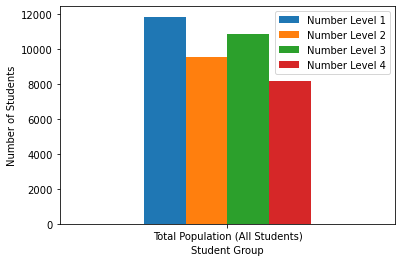

In [80]:
total = oregon_math_grade3.loc[oregon_math_grade3['Student Group'] == 'Total Population (All Students)']
sum_level1 = total.groupby('Student Group')['Number Level 1', 'Number Level 2', 'Number Level 3', 'Number Level 4'].sum()
print("Chart that shows the whole population's distribution: ")
ax = sum_level1.plot(kind = 'bar')
plt.xticks(rotation=0)
plt.ylabel("Number of Students")

In [81]:
# Number of times each value is present (not number of students within the student group)
print(oregon_math_grade3['Student Group'].value_counts())

Total Population (All Students)    685
White                              655
Hispanic/Latino                    317
Multi-Racial                        36
Asian                               36
Black/African American              16
American Indian/Alaskan Native       4
Name: Student Group, dtype: int64


In [82]:
print(oregon_math_grade3['School'].value_counts())

Washington Elementary School    11
Highland Elementary School      11
Lincoln Elementary School        9
Hoover Elementary School         8
Jefferson Elementary School      8
                                ..
Rigler Elementary School         1
Cascade Virtual Academy          1
South Columbia Family School     1
St Paul Elementary School        1
John Muir Elementary School      1
Name: School, Length: 654, dtype: int64


### Level 4 Student Group Data

In [83]:
# Distribution over Student Groups for Level 4 Per School
m_grade3_level4 = oregon_math_grade3.groupby(['Number Level 4', 'Student Group']).size()
m_grade3_level4 = pd.DataFrame(m_grade3_level4.reset_index(name = "Group_Count"))
m_grade3_level4

,Number Level 4,Student Group,Group_Count
0,0,American Indian/Alaskan Native,1
1,0,Black/African American,7
2,0,Hispanic/Latino,75
3,0,Multi-Racial,3
4,0,Total Population (All Students),23
...,...,...,...
141,58,Total Population (All Students),1
142,59,Total Population (All Students),1
143,67,White,1
144,69,Total Population (All Students),1


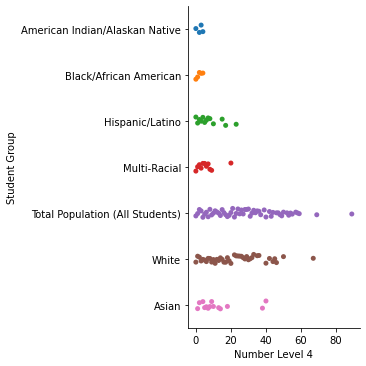

In [85]:
res = seaborn.catplot(x="Number Level 4", y="Student Group", data=m_grade3_level4)
plt.show()

### Level 3 Student Group Data

In [86]:
# Distribution over Student Groups for Level 3 Per School
m_grade3_level3 = oregon_math_grade3.groupby(['Number Level 3', 'Student Group']).size()
m_grade3_level3 = pd.DataFrame(m_grade3_level3.reset_index(name = "Group_Count"))
m_grade3_level3

,Number Level 3,Student Group,Group_Count
0,0,Asian,1
1,0,Black/African American,2
2,0,Hispanic/Latino,3
3,0,Multi-Racial,2
4,0,Total Population (All Students),3
...,...,...,...
127,40,Total Population (All Students),5
128,40,White,1
129,42,Total Population (All Students),1
130,46,Total Population (All Students),1


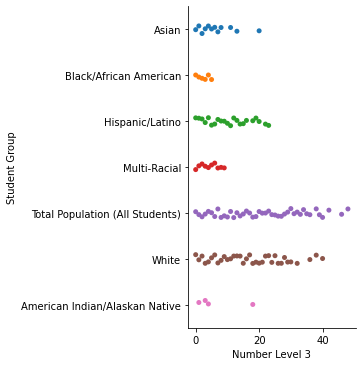

In [88]:
res = seaborn.catplot(x="Number Level 3", y="Student Group", data=m_grade3_level3)
plt.show()

### Level 2 Student Group Data

In [89]:
# Distribution over Student Groups for Level 3 Per School
m_grade3_level2 = oregon_math_grade3.groupby(['Number Level 2', 'Student Group']).size()
m_grade3_level2 = pd.DataFrame(m_grade3_level2.reset_index(name = "Group_Count"))
m_grade3_level2

,Number Level 2,Student Group,Group_Count
0,0,Asian,4
1,0,Black/African American,1
2,0,Hispanic/Latino,6
3,0,White,2
4,1,Asian,8
...,...,...,...
114,38,Total Population (All Students),2
115,39,Total Population (All Students),1
116,41,Total Population (All Students),1
117,43,Total Population (All Students),1


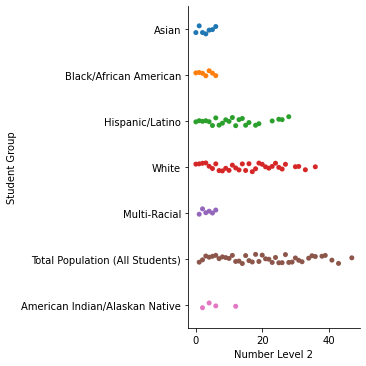

In [90]:
res = seaborn.catplot(x="Number Level 2", y="Student Group", data=m_grade3_level2)
plt.show()

### Level 1 Student Group Data

In [91]:
# Distribution over Student Groups for Level 3 Per School
m_grade3_level1 = oregon_math_grade3.groupby(['Number Level 1', 'Student Group']).size()
m_grade3_level1 = pd.DataFrame(m_grade3_level1.reset_index(name = "Group_Count"))
m_grade3_level1

,Number Level 1,Student Group,Group_Count
0,0,Asian,4
1,0,Multi-Racial,9
2,0,Total Population (All Students),3
3,0,White,13
4,1,Asian,15
...,...,...,...
158,61,Total Population (All Students),1
159,62,Total Population (All Students),1
160,65,Total Population (All Students),1
161,68,Total Population (All Students),1


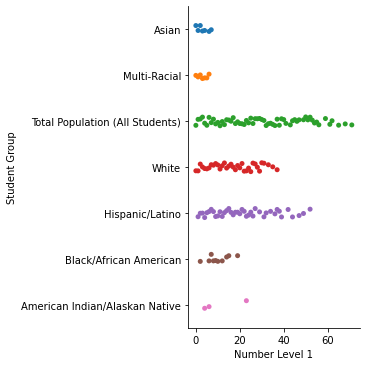

In [92]:
res = seaborn.catplot(x="Number Level 1", y="Student Group", data=m_grade3_level1)
plt.show()

### Sum of Students per Group in Level 1

In [93]:
# Finding sum of each Student Group Per Level

In [94]:
# Difference and total and sum of groups is due to NaN
m_sum_level1 = oregon_math_grade3
m_sum_level1['Number Level 1'] = pd.to_numeric(m_sum_level1['Number Level 1'])
m_sum_level1 = m_sum_level1.groupby('Student Group')['Number Level 1'].sum()
m_sum_level1

Student Group
American Indian/Alaskan Native        39
Asian                                 70
Black/African American               159
Hispanic/Latino                     3701
Multi-Racial                          70
Total Population (All Students)    11864
White                               5716
Name: Number Level 1, dtype: int64

Each Student Group in Math Level 1 has a count of: 


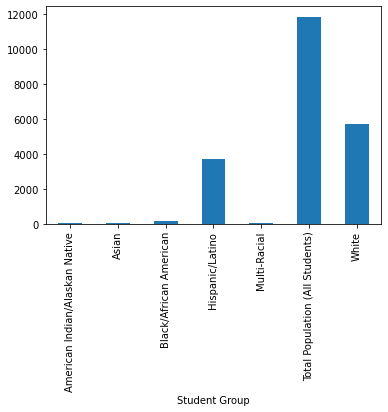

In [95]:
print("Each Student Group in Math Level 1 has a count of: ")
ax = m_sum_level1.plot(kind = 'bar')

### Sum of Students per Group in Level 2

In [96]:
# Finding sum of each Student Group Per Level

In [97]:
# Difference and total and sum of groups is due to NaN
m_sum_level2 = oregon_math_grade3
m_sum_level2['Number Level 2'] = pd.to_numeric(m_sum_level2['Number Level 2'])
m_sum_level2 = m_sum_level2.groupby('Student Group')['Number Level 2'].sum()
m_sum_level2

Student Group
American Indian/Alaskan Native       24
Asian                                87
Black/African American               45
Hispanic/Latino                    2039
Multi-Racial                         88
Total Population (All Students)    9567
White                              5842
Name: Number Level 2, dtype: int64

Each Student Group in Math Level 2 has a count of: 


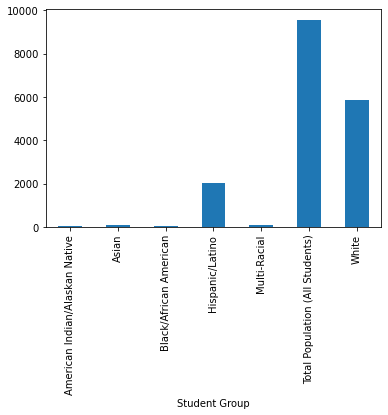

In [98]:
print("Each Student Group in Math Level 2 has a count of: ")
ax = m_sum_level2.plot(kind = 'bar')

### Sum of Students per Group in Level 3

In [99]:
# Finding sum of each Student Group Per Level

In [100]:
# Difference and total and sum of groups is due to NaN
m_sum_level3 = oregon_math_grade3
m_sum_level3['Number Level 3'] = pd.to_numeric(m_sum_level3['Number Level 3'])
m_sum_level3 = m_sum_level3.groupby('Student Group')['Number Level 3'].sum()
m_sum_level3

Student Group
American Indian/Alaskan Native        26
Asian                                179
Black/African American                31
Hispanic/Latino                     1706
Multi-Racial                         140
Total Population (All Students)    10889
White                               7329
Name: Number Level 3, dtype: int64

Each Student Group in Math Level 3 has a count of: 


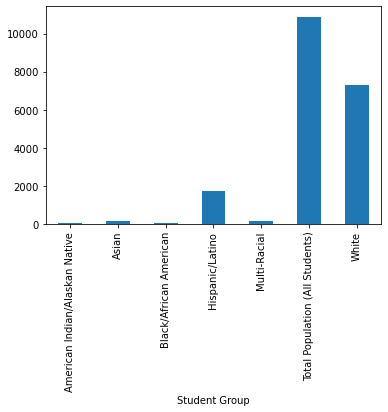

In [101]:
print("Each Student Group in Math Level 3 has a count of: ")
ax = m_sum_level3.plot(kind = 'bar')

### Sum of Students per Group in Level 4

In [102]:
# Finding sum of each Student Group Per Level

In [103]:
# Difference and total and sum of groups is due to NaN
m_sum_level4 = oregon_math_grade3
m_sum_level4['Number Level 4'] = pd.to_numeric(m_sum_level4['Number Level 4'])
m_sum_level4 = m_sum_level4.groupby('Student Group')['Number Level 4'].sum()
m_sum_level4

Student Group
American Indian/Alaskan Native        9
Asian                               306
Black/African American               17
Hispanic/Latino                     708
Multi-Racial                        159
Total Population (All Students)    8192
White                              5873
Name: Number Level 4, dtype: int64

Each Student Group in Math Level 4 has a count of: 


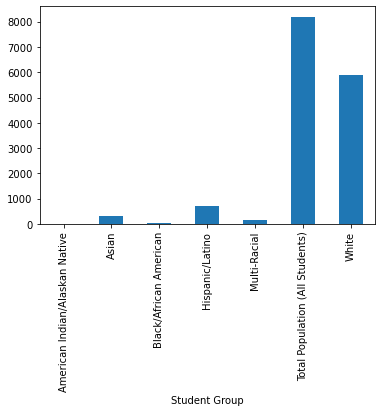

In [104]:
print("Each Student Group in Math Level 4 has a count of: ")
ax = m_sum_level4.plot(kind = 'bar')

### Add Proficiency Column
Determines whether student group scores proficiently

In [105]:
#Adding column to declare proficiency 

In [106]:
oregon_math_grade3['Percent Proficient (Level 3 or 4)'] = pd.to_numeric(oregon_math_grade3['Percent Proficient (Level 3 or 4)'])
oregon_math_grade3['Overall Proficient?'] = oregon_math_grade3.apply(lambda x: (1 if (x['Percent Proficient (Level 3 or 4)'] >= 50.0) else 0), axis = 1) 
oregon_math_grade3.head()

,District,School,Subject,Student Group,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?
76,Adrian SD 61,Adrian Elementary School,Mathematics,Total Population (All Students),Grade 3,9,45.0,2,7,6,5,20,0
82,Adrian SD 61,Adrian Elementary School,Mathematics,White,Grade 3,8,44.4,2,6,6,4,18,0
170,Amity SD 4J,Amity Elementary School,Mathematics,Total Population (All Students),Grade 3,24,52.2,7,17,9,13,46,1
173,Amity SD 4J,Amity Elementary School,Mathematics,White,Grade 3,22,57.9,7,15,7,9,38,1
300,Annex SD 29,Annex Charter School,Mathematics,Total Population (All Students),Grade 3,8,61.5,2,6,3,2,13,1


### Categorize Student Groups
0: 'American Indian/Alaskan Native'

1: 'Asian'

2: 'Black/African American'

3: 'Hispanic/Latino'

4: 'Multi-Racial'

5: 'Total Population (All Students)'

6: 'White'

In [107]:
m_sg = np.unique(oregon_math_grade3['Student Group'])
m_sg

array(['American Indian/Alaskan Native', 'Asian',
       'Black/African American', 'Hispanic/Latino', 'Multi-Racial',
       'Total Population (All Students)', 'White'], dtype=object)

In [108]:
#from sklearn.preprocessing import LabelEncoder
m_sgle = LabelEncoder()
m_sg_labels = m_sgle.fit_transform(oregon_math_grade3['Student Group'])
m_sg_mappings = {index: label for index, label in 
                  enumerate(m_sgle.classes_)}
m_sg_mappings

{0: 'American Indian/Alaskan Native',
 1: 'Asian',
 2: 'Black/African American',
 3: 'Hispanic/Latino',
 4: 'Multi-Racial',
 5: 'Total Population (All Students)',
 6: 'White'}

In [109]:
#{0: 'American Indian/Alaskan Native',
# 1: 'Asian',
# 2: 'Black/African American',
# 3: 'Hispanic/Latino',
# 4: 'Multi-Racial',
# 5: 'Total Population (All Students)',
# 6: 'White'}
oregon_math_grade3['Student Group'] = m_sg_labels
oregon_math_grade3

,District,School,Subject,Student Group,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?
76,Adrian SD 61,Adrian Elementary School,Mathematics,5,Grade 3,9,45.0,2,7,6,5,20,0
82,Adrian SD 61,Adrian Elementary School,Mathematics,6,Grade 3,8,44.4,2,6,6,4,18,0
170,Amity SD 4J,Amity Elementary School,Mathematics,5,Grade 3,24,52.2,7,17,9,13,46,1
173,Amity SD 4J,Amity Elementary School,Mathematics,6,Grade 3,22,57.9,7,15,7,9,38,1
300,Annex SD 29,Annex Charter School,Mathematics,5,Grade 3,8,61.5,2,6,3,2,13,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31894,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,3,Grade 3,3,16.7,1,2,7,8,19,0
31906,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,5,Grade 3,5,20.0,1,4,8,12,26,0
31956,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,5,Grade 3,32,53.3,12,20,19,9,60,1
31958,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,6,Grade 3,29,53.7,11,18,17,8,54,1


## Begin Classification

In [110]:
df = pd.get_dummies(oregon_math_grade3, columns=['Student Group'], drop_first=True)
df

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
76,Adrian SD 61,Adrian Elementary School,Mathematics,Grade 3,9,45.0,2,7,6,5,20,0,0,0,0,0,1,0
82,Adrian SD 61,Adrian Elementary School,Mathematics,Grade 3,8,44.4,2,6,6,4,18,0,0,0,0,0,0,1
170,Amity SD 4J,Amity Elementary School,Mathematics,Grade 3,24,52.2,7,17,9,13,46,1,0,0,0,0,1,0
173,Amity SD 4J,Amity Elementary School,Mathematics,Grade 3,22,57.9,7,15,7,9,38,1,0,0,0,0,0,1
300,Annex SD 29,Annex Charter School,Mathematics,Grade 3,8,61.5,2,6,3,2,13,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31894,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,Grade 3,3,16.7,1,2,7,8,19,0,0,0,1,0,0,0
31906,Woodburn SD 103,Woodburn Arthur Academy,Mathematics,Grade 3,5,20.0,1,4,8,12,26,0,0,0,0,0,1,0
31956,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,Grade 3,32,53.3,12,20,19,9,60,1,0,0,0,0,1,0
31958,Yamhill Carlton SD 1,Yamhill Carlton Elementary School,Mathematics,Grade 3,29,53.7,11,18,17,8,54,1,0,0,0,0,0,1


In [111]:
numeric_cols = ['Overall Proficient?', 'Percent Proficient (Level 3 or 4)']
other_cols = ['District', 'School', 'Subject', 'Grade Level', 'Number Proficient', 'Number Level 4', 'Number Level 3', 'Number Level 2', 'Number Level 1', 'Number of Participants']
cat_cols = list(set(df.columns) - set(numeric_cols) - set(other_cols))
cat_cols.sort()
cat_cols

['Student Group_1',
 'Student Group_2',
 'Student Group_3',
 'Student Group_4',
 'Student Group_5',
 'Student Group_6']

### Correlation Betweeen Each Student Group and their ranking

<AxesSubplot:>

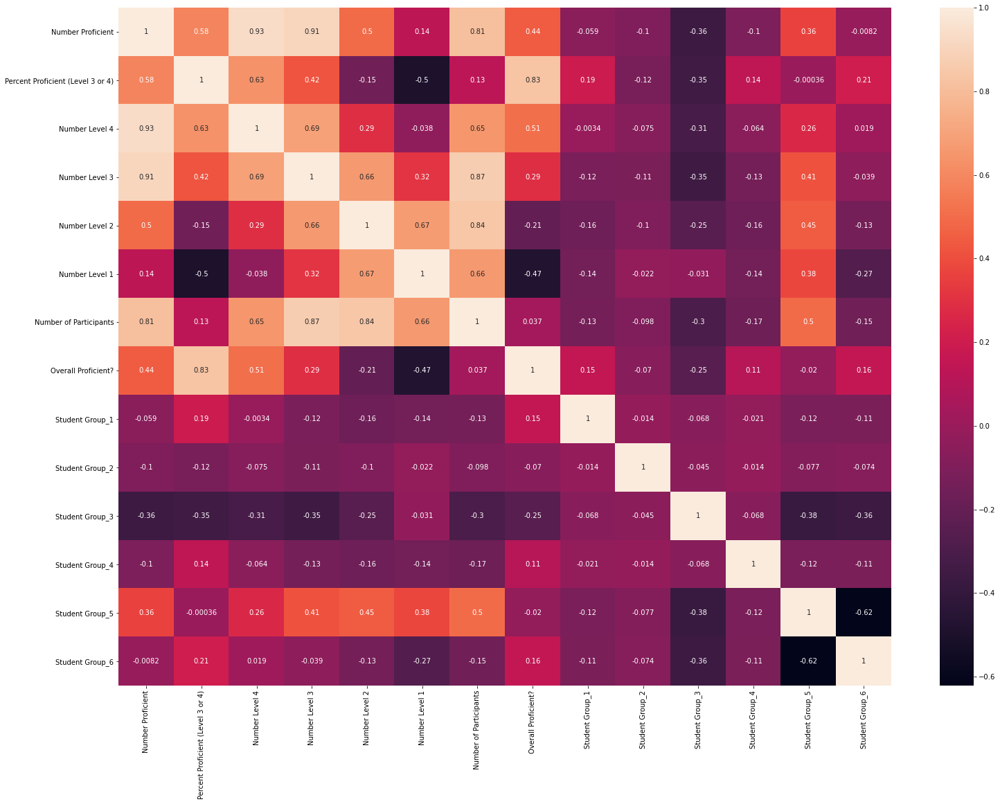

In [112]:
data_corr = df.corr()
plt.figure(figsize=(25,18))
seaborn.heatmap(data_corr, annot=True)

In [113]:
x = df[['Student Group_1', 'Student Group_2', 'Student Group_3', 'Student Group_4', 'Student Group_5', 'Student Group_6']]
y = df['Overall Proficient?']

In [114]:
x, y = np.array(x), np.array(y)

In [115]:
oregon_math_grade3['Overall Proficient?'].value_counts()

0    1013
1     736
Name: Overall Proficient?, dtype: int64

In [116]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.70)

### Logistic Regression 

In [117]:
# Train a logistic regression mode
logreg = LogisticRegression(C=1e5)
lrmodel = logreg.fit(train, labels_train)

In [118]:
# Print accuracy
print('Accuracy of Logreg classifier on training set: {:.2f}'.format(logreg.score(train, labels_train)))
print('Accuracy of Logreg classifier on test set: {:.2f}'.format(logreg.score(test, labels_test)))

Accuracy of Logreg classifier on training set: 0.62
Accuracy of Logreg classifier on test set: 0.63


In [119]:
# Predicted values for train and test for RF
pred_train = lrmodel.predict(train)
pred_test = lrmodel.predict(test)

In [120]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[493 225]
 [238 268]]


In [121]:
# Predictive accuracy on training data
#accuracy_score(labels_train, pred_train)

In [122]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[197  98]
 [ 94 136]]


In [123]:
# Predictive accuracy
#accuracy_score(labels_test, pred_test)

### Lime Explanation for Logistic Regression

In [124]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Student Group_1', 'Student Group_2', 
                                                                          'Student Group_3', 'Student Group_4',
                                                                          'Student Group_5', 'Student Group_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [125]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[28], logreg.predict_proba, top_labels=1)

515


In [127]:
df.iloc[[i]]

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
9228,Gaston SD 511J,Gaston Elementary School,Mathematics,Grade 3,4,26.7,1,3,6,5,15,0,0,0,0,0,0,1


In [126]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

## Random Forest

In [128]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.80)

In [129]:
rf = RandomForestClassifier(n_estimators=500)
rfmodel = rf.fit(train, labels_train)

In [130]:
# Predicted values for train and test for RF
pred_train = rfmodel.predict(train)
pred_test = rfmodel.predict(test)

In [131]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[552 256]
 [272 319]]


In [132]:
# Predictive accuracy on training data
accuracy_score(labels_train, pred_train)

0.6225875625446747

In [133]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[138  67]
 [ 60  85]]


In [134]:
# Predictive accuracy
accuracy_score(labels_test, pred_test)

0.6371428571428571

### Lime Explanation for Random Forest 

In [135]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Student Group_1', 'Student Group_2', 
                                                                          'Student Group_3', 'Student Group_4',
                                                                          'Student Group_5', 'Student Group_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [136]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[i], rf.predict_proba, top_labels=1)

277


In [137]:
df.iloc[[i]]

,District,School,Subject,Grade Level,Number Proficient,Percent Proficient (Level 3 or 4),Number Level 4,Number Level 3,Number Level 2,Number Level 1,Number of Participants,Overall Proficient?,Student Group_1,Student Group_2,Student Group_3,Student Group_4,Student Group_5,Student Group_6
4658,Central SD 13J,Ash Creek Elementary School,Mathematics,Grade 3,30,41.1,9,21,16,27,73,0,0,0,0,0,1,0


In [138]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

# Mississippi ELA

In [5]:
#Mississippi ELA 

In [6]:
data = pd.read_csv('2019_assessment_achievement_gap_analysiscopy1.csv', low_memory=False)
ms_df = pd.DataFrame(data)
ms_df

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient
0,Aberdeen School District,Multiracial,12,0.333333333,4
1,Aberdeen School District,White,15,0.533333333,8
2,Aberdeen School District,African American,597,0.264656616,158
3,Aberdeen School District,All Students,627,0.272727273,171
4,Aberdeen School District,Hispanic,*,*,*
...,...,...,...,...,...
996,Yazoo Co School District,Multiracial,37,0.324324324,12
997,Yazoo Co School District,African American,435,0.220689655,96
998,Yazoo Co School District,White,327,0.394495413,129
999,Yazoo Co School District,All Students,818,0.298288509,244


In [7]:
ms_newdf = ms_df[['District Name', 'Subgroup', '2019 Count', '2019 Percent Proficient', 'Number Proficient']].copy()
ms_grade3 = ms_newdf.replace('*', np.nan)
ms_grade3 = ms_grade3[ms_grade3['2019 Count'].notna()]
ms_grade3

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient
0,Aberdeen School District,Multiracial,12,0.333333333,4
1,Aberdeen School District,White,15,0.533333333,8
2,Aberdeen School District,African American,597,0.264656616,158
3,Aberdeen School District,All Students,627,0.272727273,171
7,Alcorn School District,Hispanic,15,0.333333333,5
...,...,...,...,...,...
995,Yazoo Co School District,Hispanic,11,0.181818182,2
996,Yazoo Co School District,Multiracial,37,0.324324324,12
997,Yazoo Co School District,African American,435,0.220689655,96
998,Yazoo Co School District,White,327,0.394495413,129


In [8]:
ms_grade3['2019 Count'] = pd.to_numeric(ms_grade3['2019 Count'])
ms_grade3['Number Proficient'] = pd.to_numeric(ms_grade3['Number Proficient'])

## Mississppi ELA Population Distribution

In [9]:
# Number of times each value is present (not number of students within the student group)
print(ms_grade3['Subgroup'].value_counts())

African American                    143
All Students                        143
White                               125
Hispanic                            100
Multiracial                          98
Native American/Pacific Islander     74
Asian                                68
Name: Subgroup, dtype: int64


In [10]:
print(ms_grade3['District Name'].value_counts())

Jackson Co School District                        7
Biloxi Public School District                     7
Rankin Co School District                         7
Benton Co School District                         7
Harrison Co School District                       7
                                                 ..
Winona-Montgomery Consolidated School District    3
South Delta School District                       3
Okolona Separate School District                  3
Tunica County School District                     3
Canton Public School District                     3
Name: District Name, Length: 143, dtype: int64


### Student Groups that Performed Proficiently 

In [11]:
# Finding sum of each Student Group Per Level

In [12]:
# Distribution over Student Groups for Proficiency
ms_grade3_prof = ms_grade3.groupby(['Number Proficient', 'Subgroup']).size()
ms_grade3_prof = pd.DataFrame(ms_grade3_prof.reset_index())
ms_grade3_prof

,Number Proficient,Subgroup,0
0,0,Asian,29
1,0,Hispanic,6
2,0,Multiracial,10
3,0,Native American/Pacific Islander,60
4,0,White,1
...,...,...,...
498,4339,White,1
499,4404,All Students,1
500,5568,White,1
501,5683,All Students,1


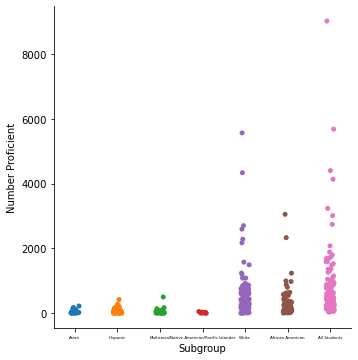

In [13]:
res = seaborn.catplot(x="Subgroup", y="Number Proficient", data=ms_grade3_prof)
plt.tick_params(axis='x', which='major', labelsize=4)
plt.show()

In [14]:
# Difference and total and sum of groups is due to NaN
sum_proficient = ms_grade3
sum_proficient = sum_proficient.groupby('Subgroup')['Number Proficient'].sum()
sum_proficient

Subgroup
African American                     32637
All Students                        104082
Asian                                 1636
Hispanic                              3893
Multiracial                           2807
Native American/Pacific Islander       204
White                                62492
Name: Number Proficient, dtype: int64

Each Student Group in ELA: 


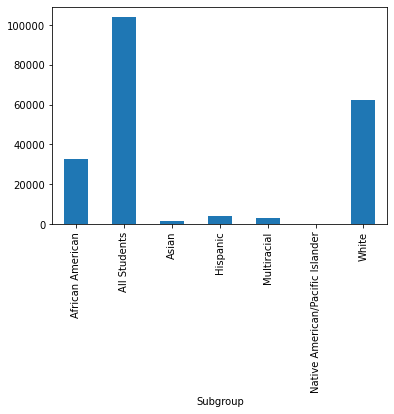

In [15]:
print("Each Student Group in ELA: ")
ax = sum_proficient.plot(kind = 'bar')

In [16]:
#Adding column to declare proficiency 

In [17]:
ms_grade3['2019 Percent Proficient'] = pd.to_numeric(ms_grade3['2019 Percent Proficient'])
ms_grade3['Overall Proficient?'] = ms_grade3.apply(lambda x: (1 if (x['2019 Percent Proficient'] >= .5) else 0), axis = 1) 
ms_grade3.head()

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?
0,Aberdeen School District,Multiracial,12,0.333333,4,0
1,Aberdeen School District,White,15,0.533333,8,1
2,Aberdeen School District,African American,597,0.264657,158,0
3,Aberdeen School District,All Students,627,0.272727,171,0
7,Alcorn School District,Hispanic,15,0.333333,5,0


In [18]:
sg = np.unique(ms_grade3['Subgroup'])
sg

array(['African American', 'All Students', 'Asian', 'Hispanic',
       'Multiracial', 'Native American/Pacific Islander', 'White'],
      dtype=object)

In [19]:
from sklearn.preprocessing import LabelEncoder
sgle = LabelEncoder()
sg_labels = sgle.fit_transform(ms_grade3['Subgroup'])
sg_mappings = {index: label for index, label in 
                  enumerate(sgle.classes_)}
sg_mappings

{0: 'African American',
 1: 'All Students',
 2: 'Asian',
 3: 'Hispanic',
 4: 'Multiracial',
 5: 'Native American/Pacific Islander',
 6: 'White'}

In [20]:
#{0: 'African American',
# 1: 'All Students',
# 2: 'Asian',
# 3: 'Hispanic',
# 4: 'Multiracial',
# 5: 'Native American/Pacific Islander',
# 6: 'White'}
ms_grade3['Subgroup'] = sg_labels
ms_grade3

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?
0,Aberdeen School District,4,12,0.333333,4,0
1,Aberdeen School District,6,15,0.533333,8,1
2,Aberdeen School District,0,597,0.264657,158,0
3,Aberdeen School District,1,627,0.272727,171,0
7,Alcorn School District,3,15,0.333333,5,0
...,...,...,...,...,...,...
995,Yazoo Co School District,3,11,0.181818,2,0
996,Yazoo Co School District,4,37,0.324324,12,0
997,Yazoo Co School District,0,435,0.220690,96,0
998,Yazoo Co School District,6,327,0.394495,129,0


## Begin Classification

In [21]:
df = pd.get_dummies(ms_grade3, columns=['Subgroup'], drop_first=True)
df

,District Name,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?,Subgroup_1,Subgroup_2,Subgroup_3,Subgroup_4,Subgroup_5,Subgroup_6
0,Aberdeen School District,12,0.333333,4,0,0,0,0,1,0,0
1,Aberdeen School District,15,0.533333,8,1,0,0,0,0,0,1
2,Aberdeen School District,597,0.264657,158,0,0,0,0,0,0,0
3,Aberdeen School District,627,0.272727,171,0,1,0,0,0,0,0
7,Alcorn School District,15,0.333333,5,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
995,Yazoo Co School District,11,0.181818,2,0,0,0,1,0,0,0
996,Yazoo Co School District,37,0.324324,12,0,0,0,0,1,0,0
997,Yazoo Co School District,435,0.220690,96,0,0,0,0,0,0,0
998,Yazoo Co School District,327,0.394495,129,0,0,0,0,0,0,1


In [22]:
numeric_cols = ['Overall Proficient?', '2019 Percent Proficient']
other_cols = ['2019 Count', 'District Name', 'Number Proficient']
cat_cols = list(set(df.columns) - set(numeric_cols) - set(other_cols))
cat_cols.sort()
cat_cols

['Subgroup_1',
 'Subgroup_2',
 'Subgroup_3',
 'Subgroup_4',
 'Subgroup_5',
 'Subgroup_6']

### Correlation Betweeen Each Student Group and their ranking

<AxesSubplot:>

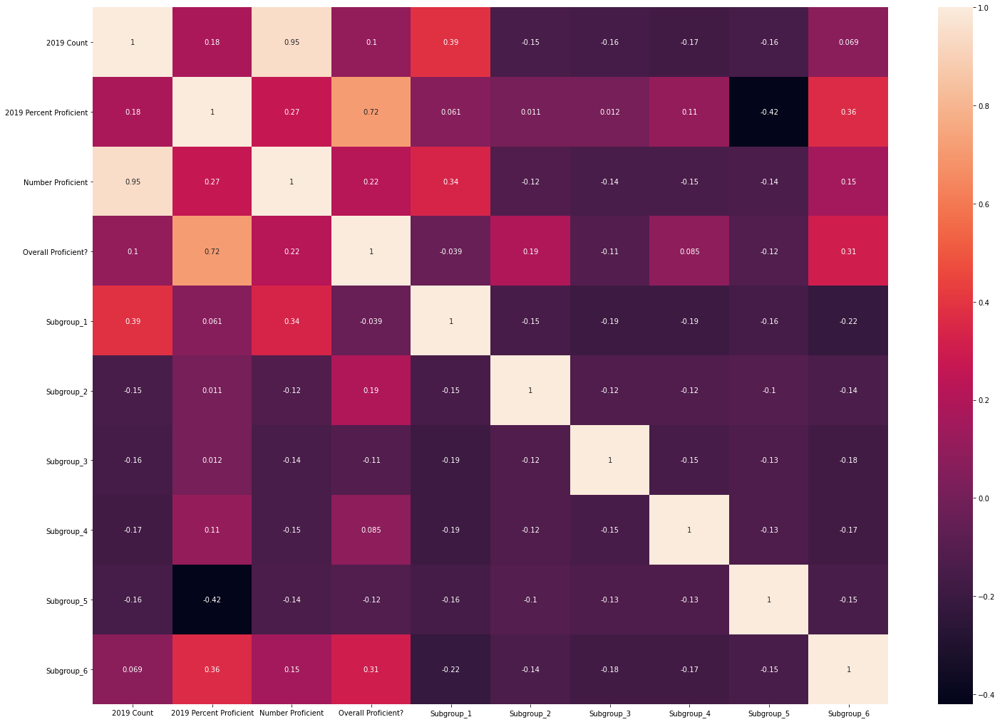

In [23]:
data_corr = df.corr()
plt.figure(figsize=(25,18))
seaborn.heatmap(data_corr, annot=True)

In [24]:
x = df[['Subgroup_1', 'Subgroup_2', 'Subgroup_3', 'Subgroup_4', 'Subgroup_5', 'Subgroup_6']]
y = df['Overall Proficient?']

In [25]:
x, y = np.array(x), np.array(y)

In [26]:
ms_grade3['Overall Proficient?'].value_counts()

0    562
1    189
Name: Overall Proficient?, dtype: int64

In [31]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.70)

### Logistic Regression 

In [32]:
# Train a logistic regression mode
logreg = LogisticRegression(C=1e5)
lrmodel = logreg.fit(train, labels_train)

In [39]:
# Print accuracy
print('Accuracy of Logreg classifier on training set: {:.2f}'.format(logreg.score(train, labels_train)))
print('Accuracy of Logreg classifier on test set: {:.2f}'.format(logreg.score(test, labels_test)))

Accuracy of Logreg classifier on training set: 0.77
Accuracy of Logreg classifier on test set: 0.76


In [40]:
# Predicted values for train and test for RF
pred_train = lrmodel.predict(train)
pred_test = lrmodel.predict(test)

In [41]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[349  38]
 [ 83  55]]


In [42]:
# Predictive accuracy on training data
#accuracy_score(labels_train, pred_train)

In [43]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[157  18]
 [ 37  14]]


In [44]:
# Predictive accuracy
#accuracy_score(labels_test, pred_test)

### Lime Explanation for Logistic Regression

In [45]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Subgroup_1', 'Subgroup_2', 
                                                                          'Subgroup_3', 'Subgroup_4',
                                                                          'Subgroup_5', 'Subgroup_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [46]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[28], logreg.predict_proba, top_labels=1)

12


In [47]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

### Random Forest

In [54]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.70)

In [55]:
rf = RandomForestClassifier(n_estimators=500)
rfmodel = rf.fit(train, labels_train)

In [56]:
# Predicted values for train and test for RF
pred_train = rfmodel.predict(train)
pred_test = rfmodel.predict(test)

In [57]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[355  39]
 [ 84  47]]


In [58]:
# Predictive accuracy on training data
accuracy_score(labels_train, pred_train)

0.7657142857142857

In [59]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[151  17]
 [ 36  22]]


In [60]:
# Predictive accuracy
accuracy_score(labels_test, pred_test)

0.7654867256637168

### Lime Explanation for Random Forest

In [61]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Subgroup_1', 'Subgroup_2', 
                                                                          'Subgroup_3', 'Subgroup_4',
                                                                          'Subgroup_5', 'Subgroup_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [62]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[i], rf.predict_proba, top_labels=1)

197


In [63]:
df.iloc[[i]]

,District Name,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?,Subgroup_1,Subgroup_2,Subgroup_3,Subgroup_4,Subgroup_5,Subgroup_6
262,Greenville Public Schools,2315,0.233261,540,0,1,0,0,0,0,0


In [64]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

# Mississippi Math

In [5]:
#Mississippi Math

In [6]:
data = pd.read_csv('2019_assessment_achievement_gap_analysismath.csv', low_memory=False)
ms_math_df = pd.DataFrame(data)
ms_math_df

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient
0,NaN,NaN,NaN,NaN,NaN
1,Aberdeen School District,All Students,636,0.330188679,210
2,Aberdeen School District,White,16,0.375,6
3,Aberdeen School District,African American,605,0.32231405,195
4,Aberdeen School District,Hispanic,*,*,*
...,...,...,...,...,...
997,Yazoo Co School District,African American,438,0.289954338,127
998,Yazoo Co School District,Hispanic,13,0.384615385,5
999,Yazoo Co School District,Asian,*,*,*
1000,Yazoo Co School District,Multiracial,40,0.35,14


In [7]:
ms_math_newdf = ms_math_df[['District Name', 'Subgroup', '2019 Count', '2019 Percent Proficient', 'Number Proficient']].copy()
ms_math_grade3 = ms_math_newdf.replace('*', np.nan)
ms_math_grade3 = ms_math_grade3[ms_math_grade3['2019 Count'].notna()]
ms_math_grade3

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient
1,Aberdeen School District,All Students,636,0.330188679,210
2,Aberdeen School District,White,16,0.375,6
3,Aberdeen School District,African American,605,0.32231405,195
6,Aberdeen School District,Multiracial,12,0.583333333,7
8,Alcorn School District,All Students,1596,0.535714286,855
...,...,...,...,...,...
996,Yazoo Co School District,White,332,0.394578313,131
997,Yazoo Co School District,African American,438,0.289954338,127
998,Yazoo Co School District,Hispanic,13,0.384615385,5
1000,Yazoo Co School District,Multiracial,40,0.35,14


In [8]:
ms_math_grade3['2019 Count'] = pd.to_numeric(ms_math_grade3['2019 Count'])
ms_math_grade3['Number Proficient'] = pd.to_numeric(ms_math_grade3['Number Proficient'])

## Mississppi Math Population Distribution

In [9]:
# Number of times each value is present (not number of students within the student group)
print(ms_math_grade3['Subgroup'].value_counts())

All Students                        143
African American                    143
White                               125
Hispanic                             99
Multiracial                          99
Native American/Pacific Islander     73
Asian                                67
Name: Subgroup, dtype: int64


In [10]:
print(ms_math_grade3['District Name'].value_counts())

Ocean Springs School District                     7
Petal School District                             7
Neshoba County School District                    7
Jones Co School District                          7
Leake Co School District                          7
                                                 ..
Winona-Montgomery Consolidated School District    3
Humphreys Co School District                      3
East Jasper Consolidated School District          3
Amite Co School District                          3
South Delta School District                       3
Name: District Name, Length: 143, dtype: int64


### Student Groups that Performed Proficiently

In [11]:
# Finding sum of each Student Group Per Level

In [12]:
# Difference and total and sum of groups is due to NaN
sum_math_proficient = ms_math_grade3
sum_math_proficient = sum_math_proficient.groupby('Subgroup')['Number Proficient'].sum()
sum_math_proficient

Subgroup
African American                     39114
All Students                        118649
Asian                                 2018
Hispanic                              5177
Multiracial                           3242
Native American/Pacific Islander       258
White                                68354
Name: Number Proficient, dtype: int64

Each Student Group in Math: 


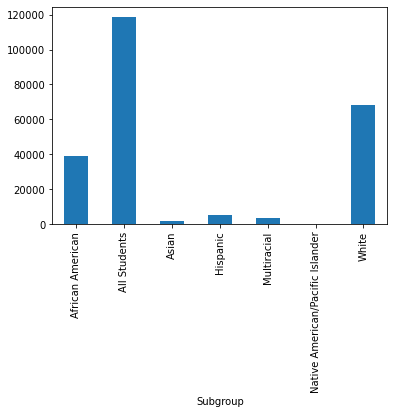

In [13]:
print("Each Student Group in Math: ")
ax = sum_math_proficient.plot(kind = 'bar')

In [14]:
#Adding column to declare proficiency 

In [15]:
ms_math_grade3['2019 Percent Proficient'] = pd.to_numeric(ms_math_grade3['2019 Percent Proficient'])
ms_math_grade3['Overall Proficient?'] = ms_math_grade3.apply(lambda x: (1 if (x['2019 Percent Proficient'] >= .5) else 0), axis = 1) 
ms_math_grade3.head()

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?
1,Aberdeen School District,All Students,636,0.330189,210,0
2,Aberdeen School District,White,16,0.375000,6,0
3,Aberdeen School District,African American,605,0.322314,195,0
6,Aberdeen School District,Multiracial,12,0.583333,7,1
8,Alcorn School District,All Students,1596,0.535714,855,1


In [16]:
sg = np.unique(ms_math_grade3['Subgroup'])
sg

array(['African American', 'All Students', 'Asian', 'Hispanic',
       'Multiracial', 'Native American/Pacific Islander', 'White'],
      dtype=object)

In [17]:
from sklearn.preprocessing import LabelEncoder
sgle = LabelEncoder()
sg_labels = sgle.fit_transform(ms_math_grade3['Subgroup'])
sg_mappings = {index: label for index, label in 
                  enumerate(sgle.classes_)}
sg_mappings

{0: 'African American',
 1: 'All Students',
 2: 'Asian',
 3: 'Hispanic',
 4: 'Multiracial',
 5: 'Native American/Pacific Islander',
 6: 'White'}

In [18]:
#{0: 'African American',
# 1: 'All Students',
# 2: 'Asian',
# 3: 'Hispanic',
# 4: 'Multiracial',
# 5: 'Native American/Pacific Islander',
# 6: 'White'}
ms_math_grade3['Subgroup'] = sg_labels
ms_math_grade3

,District Name,Subgroup,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?
1,Aberdeen School District,1,636,0.330189,210,0
2,Aberdeen School District,6,16,0.375000,6,0
3,Aberdeen School District,0,605,0.322314,195,0
6,Aberdeen School District,4,12,0.583333,7,1
8,Alcorn School District,1,1596,0.535714,855,1
...,...,...,...,...,...,...
996,Yazoo Co School District,6,332,0.394578,131,0
997,Yazoo Co School District,0,438,0.289954,127,0
998,Yazoo Co School District,3,13,0.384615,5,0
1000,Yazoo Co School District,4,40,0.350000,14,0


## Begin Classification

In [19]:
df = pd.get_dummies(ms_math_grade3, columns=['Subgroup'], drop_first=True)
df

,District Name,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?,Subgroup_1,Subgroup_2,Subgroup_3,Subgroup_4,Subgroup_5,Subgroup_6
1,Aberdeen School District,636,0.330189,210,0,1,0,0,0,0,0
2,Aberdeen School District,16,0.375000,6,0,0,0,0,0,0,1
3,Aberdeen School District,605,0.322314,195,0,0,0,0,0,0,0
6,Aberdeen School District,12,0.583333,7,1,0,0,0,1,0,0
8,Alcorn School District,1596,0.535714,855,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
996,Yazoo Co School District,332,0.394578,131,0,0,0,0,0,0,1
997,Yazoo Co School District,438,0.289954,127,0,0,0,0,0,0,0
998,Yazoo Co School District,13,0.384615,5,0,0,0,1,0,0,0
1000,Yazoo Co School District,40,0.350000,14,0,0,0,0,1,0,0


In [20]:
numeric_cols = ['Overall Proficient?', '2019 Percent Proficient']
other_cols = ['2019 Count', 'District Name', 'Number Proficient']
cat_cols = list(set(df.columns) - set(numeric_cols) - set(other_cols))
cat_cols.sort()
cat_cols

['Subgroup_1',
 'Subgroup_2',
 'Subgroup_3',
 'Subgroup_4',
 'Subgroup_5',
 'Subgroup_6']

### Correlation Betweeen Each Student Group and their ranking

<AxesSubplot:>

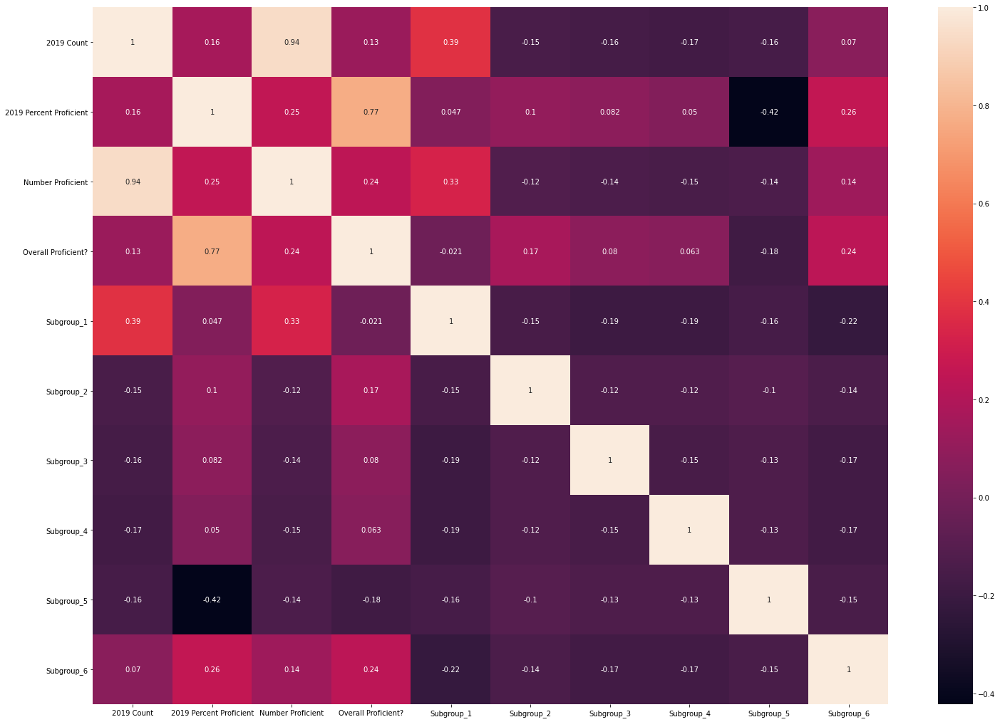

In [21]:
data_corr = df.corr()
plt.figure(figsize=(25,18))
seaborn.heatmap(data_corr, annot=True)

In [22]:
x = df[['Subgroup_1', 'Subgroup_2', 'Subgroup_3', 'Subgroup_4', 'Subgroup_5', 'Subgroup_6']]
y = df['Overall Proficient?']

In [23]:
x, y = np.array(x), np.array(y)

In [24]:
ms_math_grade3['Overall Proficient?'].value_counts()

0    482
1    267
Name: Overall Proficient?, dtype: int64

In [25]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.70)

### Logistic Regression 

In [26]:
# Train a logistic regression mode
logreg = LogisticRegression(C=1e5)
lrmodel = logreg.fit(train, labels_train)

In [27]:
# Print accuracy
print('Accuracy of Logreg classifier on training set: {:.2f}'.format(logreg.score(train, labels_train)))
print('Accuracy of Logreg classifier on test set: {:.2f}'.format(logreg.score(test, labels_test)))

Accuracy of Logreg classifier on training set: 0.69
Accuracy of Logreg classifier on test set: 0.71


In [28]:
# Predicted values for train and test for RF
pred_train = lrmodel.predict(train)
pred_test = lrmodel.predict(test)

In [29]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[271  60]
 [100  93]]


In [30]:
# Predictive accuracy on training data
#accuracy_score(labels_train, pred_train)

In [31]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[136  15]
 [ 50  24]]


In [32]:
# Predictive accuracy
#accuracy_score(labels_test, pred_test)

## Lime Explanation for Logistic Regression

In [37]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Subgroup_1', 'Subgroup_2', 
                                                                          'Subgroup_3', 'Subgroup_4',
                                                                          'Subgroup_5', 'Subgroup_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [38]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[28], logreg.predict_proba, top_labels=1)

68


In [41]:
df.iloc[[i]]

,District Name,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?,Subgroup_1,Subgroup_2,Subgroup_3,Subgroup_4,Subgroup_5,Subgroup_6
88,Canton Public School District,236,0.394068,93,0,0,0,1,0,0,0


In [42]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

### Random Forest

In [43]:
train, test, labels_train, labels_test = train_test_split(x, y, train_size=0.80)

In [44]:
rf = RandomForestClassifier(n_estimators=500)
rfmodel = rf.fit(train, labels_train)

In [45]:
# Predicted values for train and test for RF
pred_train = rfmodel.predict(train)
pred_test = rfmodel.predict(test)

In [46]:
# Stats on training data
CM = confusion_matrix(labels_train, pred_train)
print (CM)

[[331  61]
 [112  95]]


In [47]:
# Predictive accuracy on training data
accuracy_score(labels_train, pred_train)

0.7111853088480802

In [48]:
# Stats on testing data
CM = confusion_matrix(labels_test, pred_test)
print (CM)

[[76 14]
 [38 22]]


In [49]:
# Predictive accuracy
accuracy_score(labels_test, pred_test)

0.6533333333333333

## Lime Explainer for Random Forest

In [50]:
# Creating a LIME explainer

explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=['Subgroup_1', 'Subgroup_2', 
                                                                          'Subgroup_3', 'Subgroup_4',
                                                                          'Subgroup_5', 'Subgroup_6'], 
                                                   class_names=['0','1'], discretize_continuous=True)

In [51]:
# Instance to predict is chosen randomly from test set
i = np.random.randint(0, test.shape[0])
print (i)

# Get explanation
exp = explainer.explain_instance(test[i], rf.predict_proba, top_labels=1)

110


In [52]:
df.iloc[[i]]

,District Name,2019 Count,2019 Percent Proficient,Number Proficient,Overall Proficient?,Subgroup_1,Subgroup_2,Subgroup_3,Subgroup_4,Subgroup_5,Subgroup_6
148,Coffeeville School District,273,0.347985,95,0,1,0,0,0,0,0


In [53]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

# 